добавление файла с API токеном kaggle

In [10]:
import os
from google.colab import files

kaggle_dir = '/root/.kaggle'
os.makedirs(kaggle_dir, exist_ok=True)

uploaded = files.upload()

for fn in uploaded.keys():
    !mv '{fn}' {kaggle_dir}/kaggle.json

!chmod 600 {kaggle_dir}/kaggle.json


Saving kaggle.json to kaggle.json


In [ ]:
!pip install kaggle

In [14]:
!kaggle datasets download -d viacheslavshalamov/russian-road-signs-segmentation-dataset

Dataset URL: https://www.kaggle.com/datasets/viacheslavshalamov/russian-road-signs-segmentation-dataset
License(s): unknown
russian-road-signs-segmentation-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [15]:
!unzip -q russian-road-signs-segmentation-dataset.zip -d dataset/

replace dataset/sign_dataset/train/1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
A


In [16]:
!ls -la dataset

total 12
drwxr-xr-x 3 root root 4096 Apr  7 17:48 .
drwxr-xr-x 1 root root 4096 Apr  7 18:06 ..
drwxr-xr-x 4 root root 4096 Apr  7 18:07 sign_dataset


In [2]:
!pip install mmengine

  Using cached mmengine-0.10.7-py3-none-any.whl.metadata (20 kB)
  Using cached addict-2.4.0-py3-none-any.whl.metadata (1.0 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.7/452.7 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 20.7 MB/s eta 0:00:00


In [10]:
!pip install "setuptools==69.5.1"

In [ ]:
!pip install "numpy<2.0.0"

In [ ]:
!pip install torch==2.2.0 torchvision==0.17.0 torchaudio==2.2.0 --index-url https://download.pytorch.org/whl/cu121

!pip install mmcv==2.2.0 -f https://download.openmmlab.com/mmcv/dist/cu121/torch2.2/index.html

!pip install mmdet==3.3.0
!sed -i "s/'2.2.0'/'2.3.0'/g" /usr/local/lib/python3.12/dist-packages/mmdet/__init__.py

In [17]:
!git clone https://github.com/open-mmlab/mmdetection.git

fatal: destination path 'mmdetection' already exists and is not an empty directory.


In [ ]:
import torch
import mmcv
import mmdet


In [18]:
print(f"PyTorch: {torch.__version__}")
print(f"MMCV: {mmcv.__version__}")
print(f"MMDetection: {mmdet.__version__}")

PyTorch: 2.2.0+cu121
MMCV: 2.2.0
MMDetection: 3.3.0


In [4]:
!pip install "setuptools<70.0.0"

In [4]:
import json
import os
import cv2

import cv2
import numpy as np
import os
import glob
from mmdet.apis import init_detector, inference_detector

from google.colab.patches import cv2_imshow

from pycocotools.coco import COCO

In [5]:
def via_to_coco(via_path, img_dir, out_path):
    with open(via_path, 'r', encoding='utf-8') as f:
        via_data = json.load(f)

    coco_data = {
        "images": [], "annotations": [],
        "categories": [{"id": i, "name": str(i)} for i in range(1, 9)]
    }

    ann_id = 1
    if isinstance(via_data, dict) and "_via_settings" in via_data:
        via_data = via_data.get('_via_img_metadata', via_data)

    for img_id, (key, img_info) in enumerate(via_data.items(), 1):
        filename = img_info.get('filename')
        if not filename: continue

        img_path = os.path.join(img_dir, filename)
        if not os.path.exists(img_path): continue

        img = cv2.imread(img_path)
        if img is None: continue
        h, w = img.shape[:2]

        coco_data["images"].append({
            "id": img_id, "file_name": filename, "width": w, "height": h
        })

        regions = img_info.get('regions', [])
        if isinstance(regions, dict):
            regions = regions.values()

        for region in regions:
            shape = region.get('shape_attributes', {})
            if shape.get('name') != 'polygon': continue

            xs, ys = shape.get('all_points_x', []), shape.get('all_points_y', [])
            if not xs or not ys: continue

            poly = [val for pair in zip(xs, ys) for val in pair]
            x_min, y_min = min(xs), min(ys)
            x_max, y_max = max(xs), max(ys)

            cat_attrs = region.get('region_attributes', {})
            cat_id = 1
            for k, v in cat_attrs.items():
                if str(v).isdigit() and 1 <= int(v) <= 8:
                    cat_id = int(v)
                    break

            coco_data["annotations"].append({
                "id": ann_id, "image_id": img_id, "category_id": cat_id,
                "bbox": [x_min, y_min, x_max - x_min, y_max - y_min],
                "segmentation": [poly], "area": (x_max - x_min) * (y_max - y_min),
                "iscrowd": 0
            })
            ann_id += 1

    with open(out_path, 'w', encoding='utf-8') as f:
        json.dump(coco_data, f)
    print(f"Конвертация завершена. Сохранено в {out_path}")

via_to_coco('dataset/sign_dataset/train/via_region_data.json', 'dataset/sign_dataset/train', 'dataset/sign_dataset/train_coco.json')
via_to_coco('dataset/sign_dataset/val/via_region_data.json', 'dataset/sign_dataset/val', 'dataset/sign_dataset/val_coco.json')

Конвертация завершена. Сохранено в dataset/sign_dataset/train_coco.json
Конвертация завершена. Сохранено в dataset/sign_dataset/val_coco.json


In [ ]:
config_content = """
_base_ = './mmdetection/configs/mask_rcnn/mask-rcnn_r50_fpn_1x_coco.py'

dataset_type = 'CocoDataset'
data_root = 'dataset/sign_dataset/'
classes = ('1', '2', '3', '4', '5', '6', '7', '8')

model = dict(
    roi_head=dict(
        bbox_head=dict(num_classes=8),
        mask_head=dict(num_classes=8)))

train_dataloader = dict(
    batch_size=2,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        metainfo=dict(classes=classes),
        ann_file='train_coco.json',
        data_prefix=dict(img='train/')))

val_dataloader = dict(
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        metainfo=dict(classes=classes),
        ann_file='val_coco.json',
        data_prefix=dict(img='val/')))

test_dataloader = val_dataloader

val_evaluator = dict(type='CocoMetric', ann_file=data_root + 'val_coco.json', metric=['bbox', 'segm'])
test_evaluator = val_evaluator

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=5, val_interval=1)
optim_wrapper = dict(optimizer=dict(type='SGD', lr=0.005, momentum=0.9, weight_decay=0.0001))
load_from = 'https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_fpn_1x_coco/mask_rcnn_r50_fpn_1x_coco_20200205-d4b0c5d6.pth'
work_dir = './tutorial_exps'
"""

with open('custom_config.py', 'w') as f:
    f.write(config_content)

!python mmdetection/tools/train.py custom_config.py

In [22]:
from google.colab import drive, files
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [26]:
config_file = 'custom_config.py'
checkpoint_file = glob.glob('./tutorial_exps/epoch_*.pth')[-1]
model = init_detector(config_file, checkpoint_file, device='cuda:0')

my_photos = glob.glob('/content/drive/MyDrive/ML6lw/my_photos/*.jpg')
out_dir = 'results_my_photos'
os.makedirs(out_dir, exist_ok=True)

def calculate_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    return intersection / union if union != 0 else 0

iou_thresholds = [0.5, 0.75, 0.9]
iou_scores = []


for img_path in my_photos:
    img_name = os.path.basename(img_path)
    result = inference_detector(model, img_path)

    img = cv2.imread(img_path)
    pred_instances = result.pred_instances
    masks = pred_instances.masks.cpu().numpy()
    scores = pred_instances.scores.cpu().numpy()

    valid_idx = scores > 0.5
    masks = masks[valid_idx]

    for mask in masks:
        color_mask = np.zeros_like(img)
        color_mask[mask] = [0, 255, 0]
        img = cv2.addWeighted(img, 1.0, color_mask, 0.5, 0)

    cv2.imwrite(os.path.join(out_dir, img_name), img)
    print(f"Обработано {img_name}, найдено объектов: {len(masks)}")

Loads checkpoint by local backend from path: ./tutorial_exps/epoch_1.pth
Обработано photo10.jpg, найдено объектов: 2
Обработано photo2.jpg, найдено объектов: 5
Обработано photo9.jpg, найдено объектов: 1
Обработано photo6.jpg, найдено объектов: 2
Обработано photo8.jpg, найдено объектов: 8
Обработано photo4.jpg, найдено объектов: 3
Обработано photo5.jpg, найдено объектов: 7
Обработано photo3.jpg, найдено объектов: 6
Обработано photo7.jpg, найдено объектов: 6
Обработано photo1.jpg, найдено объектов: 6


--- Результат: results_my_photos/photo2.jpg ---


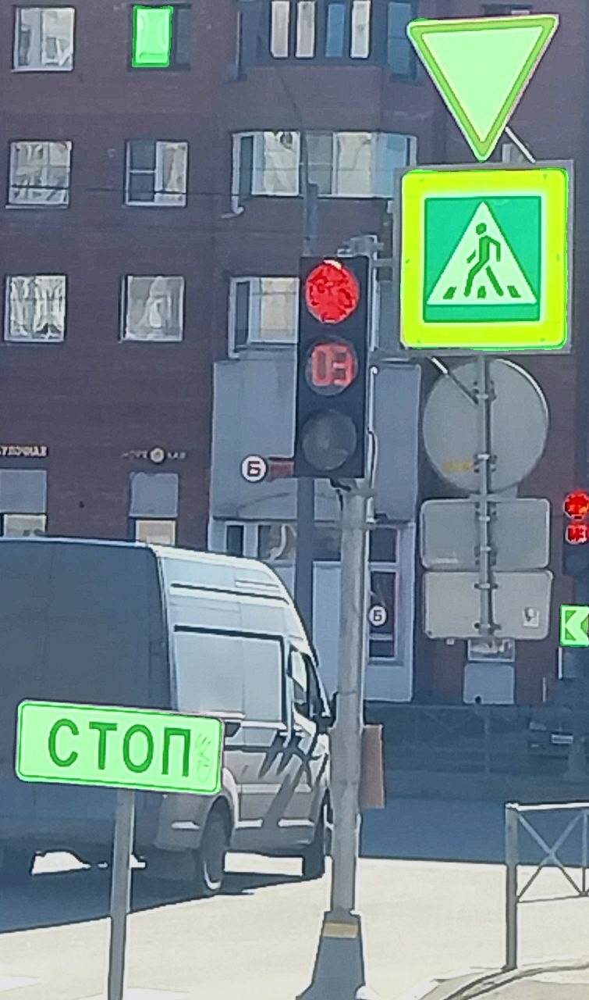

--- Результат: results_my_photos/photo8.jpg ---


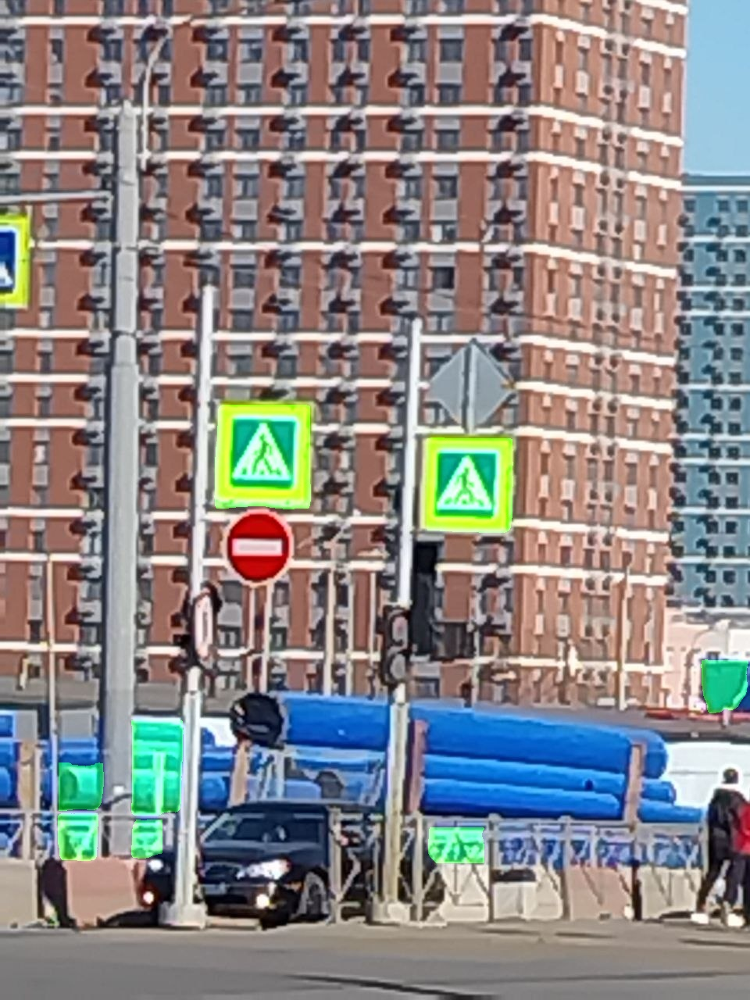

--- Результат: results_my_photos/photo1.jpg ---


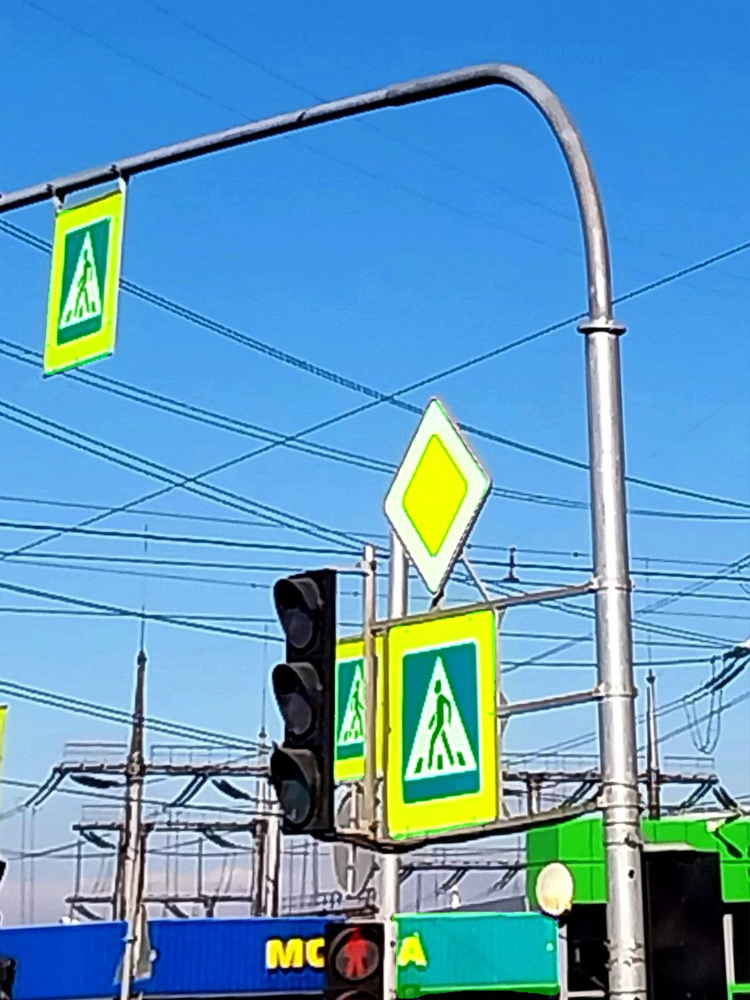

--- Результат: results_my_photos/photo7.jpg ---


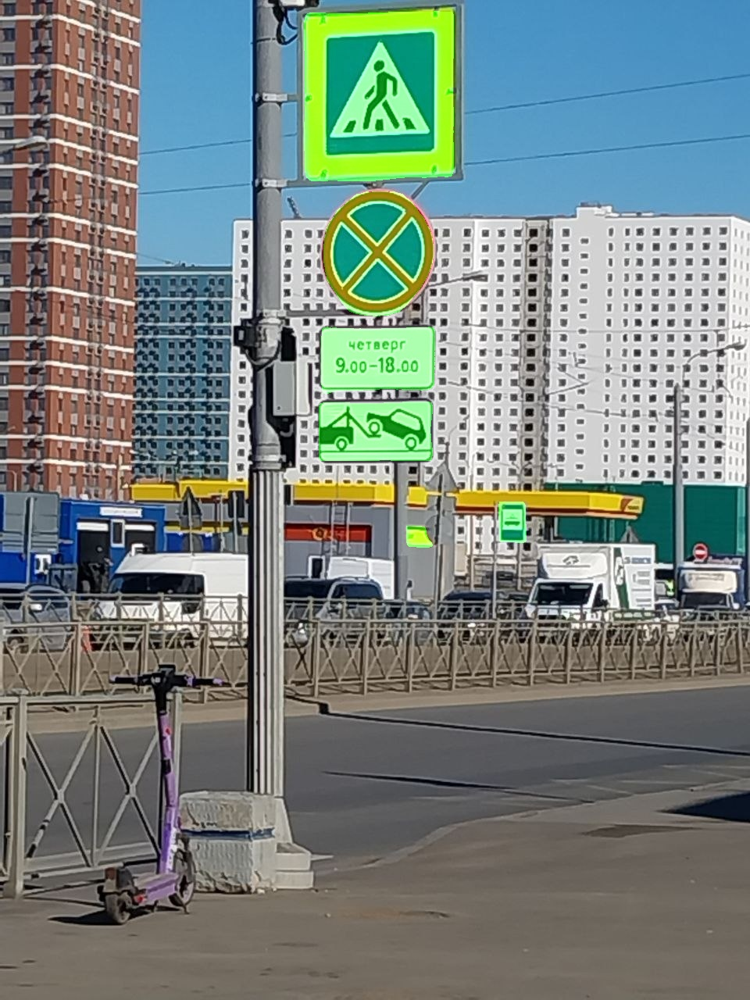

--- Результат: results_my_photos/photo6.jpg ---


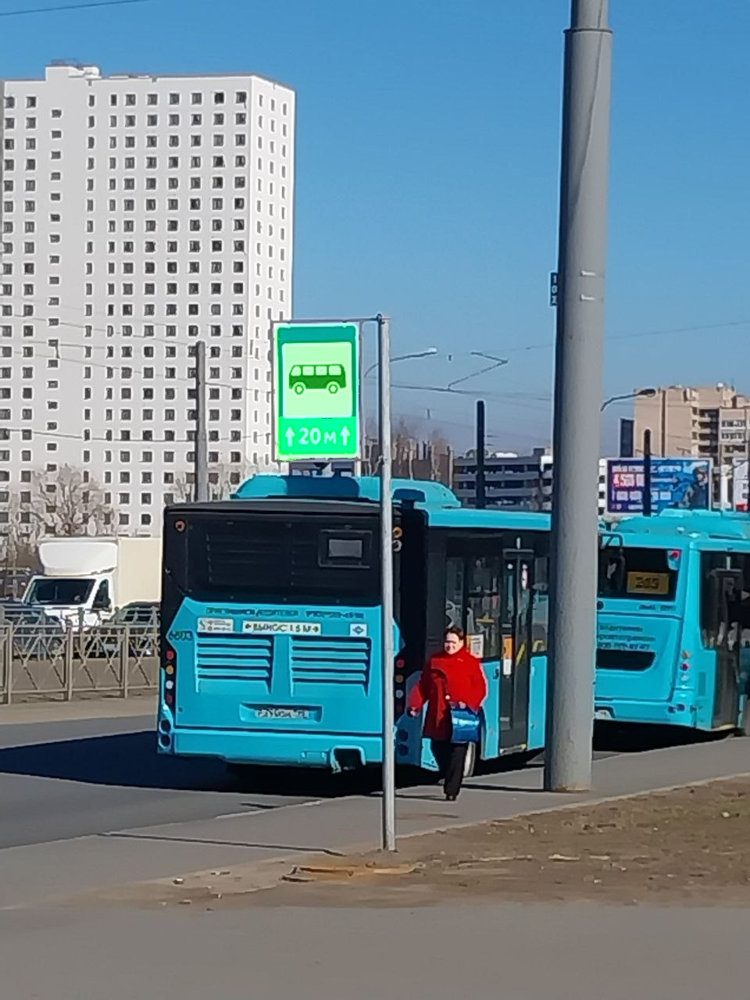

--- Результат: results_my_photos/photo4.jpg ---


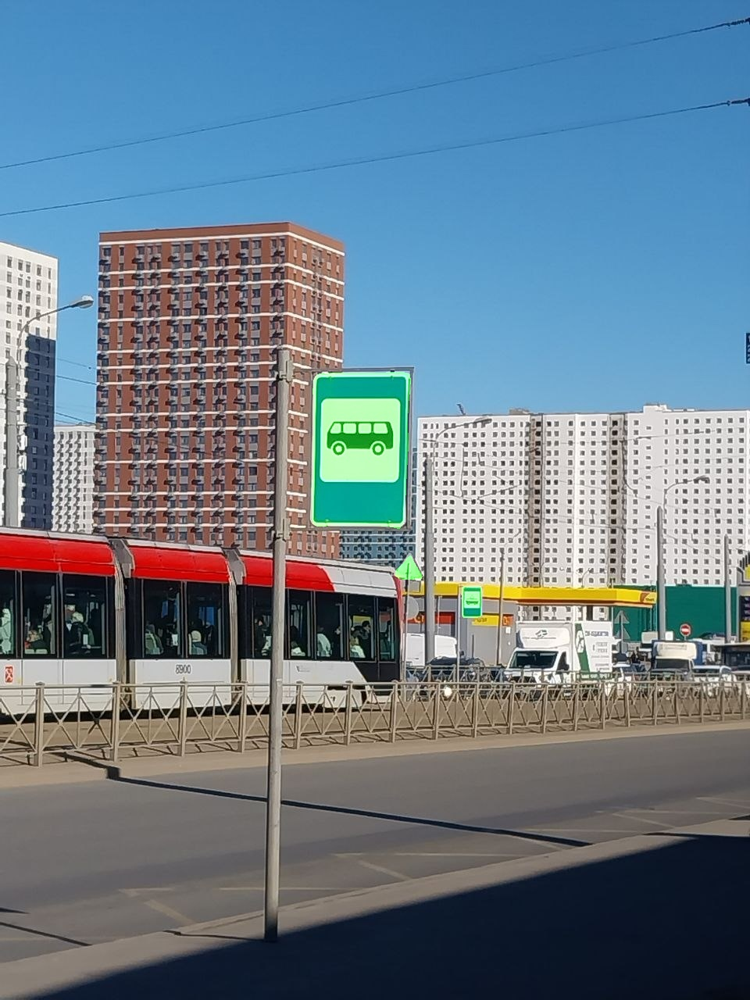

--- Результат: results_my_photos/photo3.jpg ---


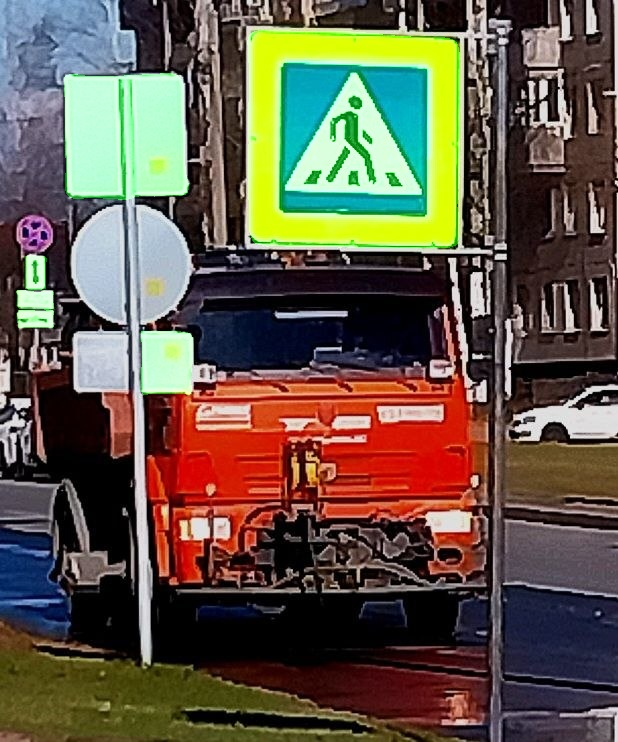

--- Результат: results_my_photos/photo10.jpg ---


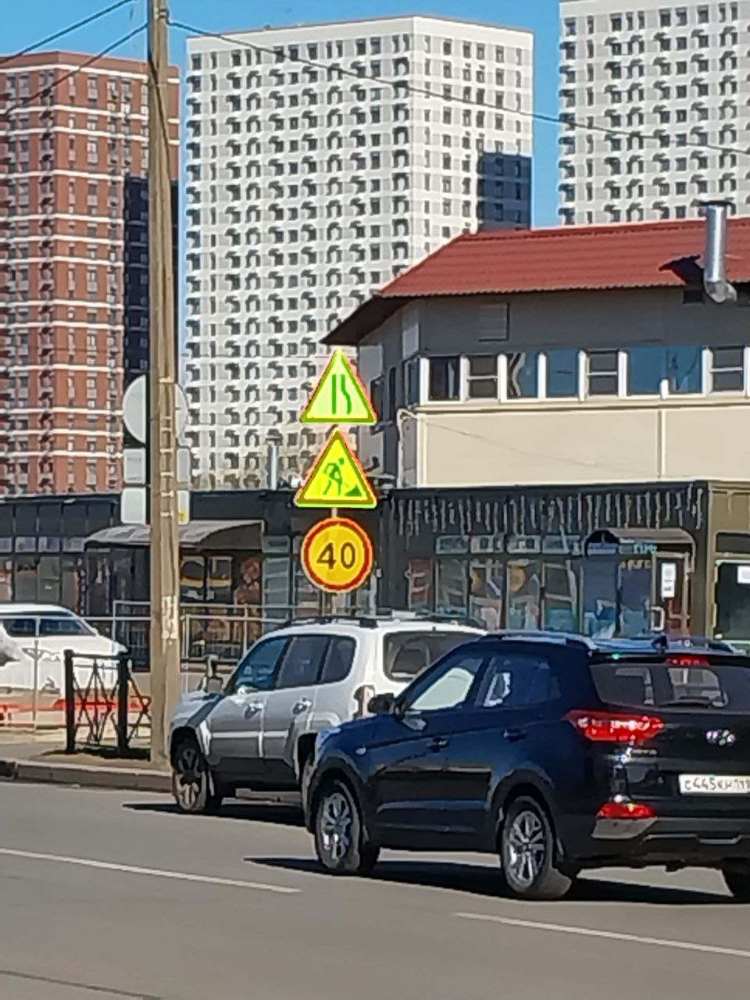

--- Результат: results_my_photos/photo5.jpg ---


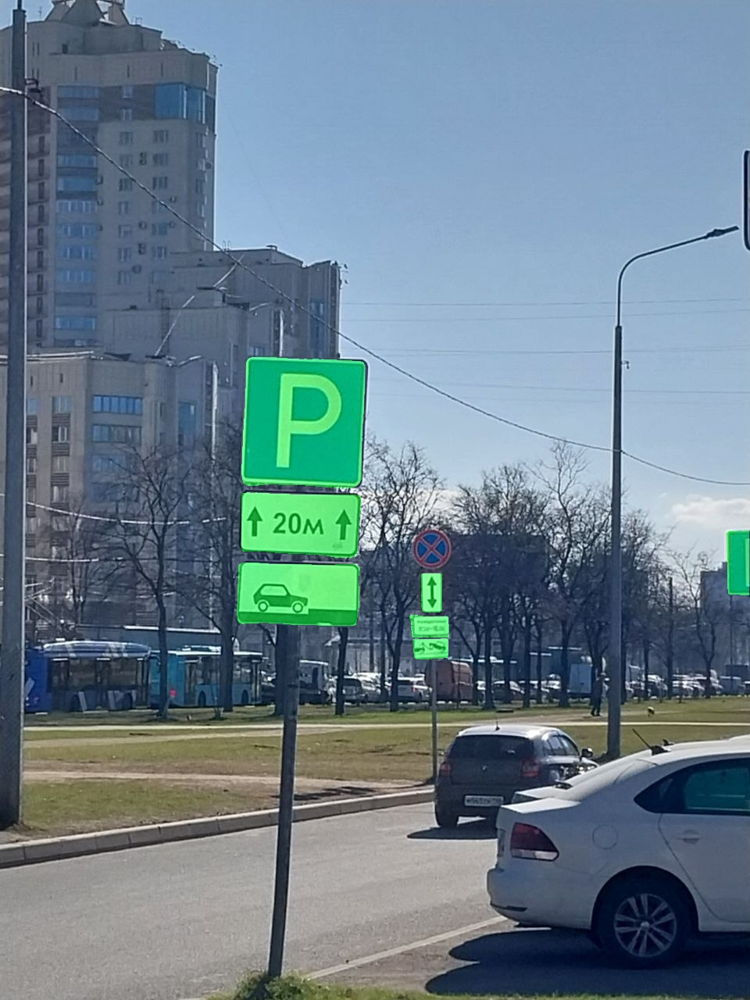

--- Результат: results_my_photos/photo9.jpg ---


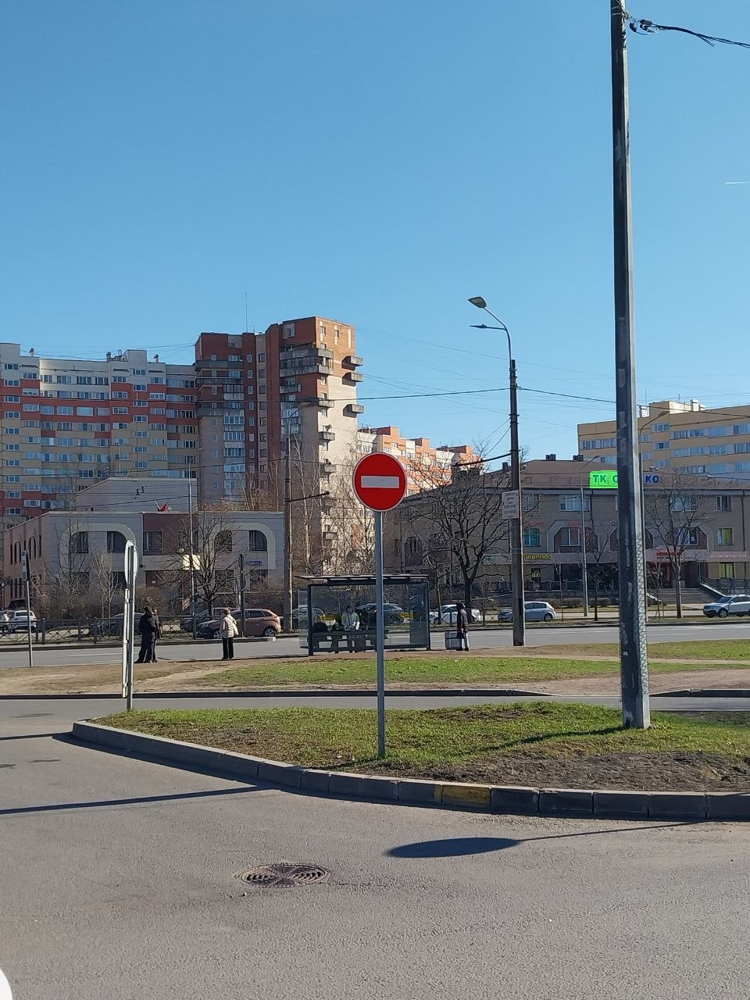

In [27]:
result_images = glob.glob('results_my_photos/*.jpg')

for img_path in result_images:
    print(f"--- Результат: {img_path} ---")
    img = cv2.imread(img_path)
    cv2_imshow(img)

In [28]:
import os
import glob
import numpy as np
from pycocotools.coco import COCO
from mmdet.apis import init_detector, inference_detector

In [48]:
via_to_coco('/content/drive/MyDrive/ML6lw/my_photos/via_region_data.json', '/content/drive/MyDrive/ML6lw/my_photos', '/content/drive/MyDrive/ML6lw/my_photos/my_coco.json')

Конвертация завершена. Сохранено в /content/drive/MyDrive/ML6lw/my_photos/my_coco.json


In [49]:
import os
import glob
import numpy as np
from pycocotools.coco import COCO
from mmdet.apis import init_detector, inference_detector

In [50]:
config_file = 'custom_config.py'
checkpoint_file = glob.glob('./tutorial_exps/epoch_*.pth')[-1]
model = init_detector(config_file, checkpoint_file, device='cuda:0')

my_photos_dir = '/content/drive/MyDrive/ML6lw/my_photos/'
via_json = os.path.join(my_photos_dir, 'via_region_data.json')
my_coco_json = os.path.join(my_photos_dir, 'my_coco.json')

if os.path.exists(via_json):
    via_to_coco(via_json, my_photos_dir, my_coco_json)


Loads checkpoint by local backend from path: ./tutorial_exps/epoch_1.pth
Конвертация завершена. Сохранено в /content/drive/MyDrive/ML6lw/my_photos/my_coco.json


In [51]:
def evaluate_segmentation(ann_file, img_dir, dataset_name):
    print(f"\nЗагрузка данных для: {dataset_name}...")
    coco = COCO(ann_file)
    img_ids = coco.getImgIds()

    ious_all = []
    l2_distances = []

    tp_50 = tp_75 = tp_90 = 0
    total_gt_objects = total_pred_objects = 0
    images_with_good_iou = {0.5: 0, 0.75: 0, 0.9: 0}

    def get_centroid(mask):
        y, x = np.where(mask)
        if len(x) == 0: return 0, 0
        return np.mean(x), np.mean(y)

    for img_id in img_ids:
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(img_dir, img_info['file_name'])

        if not os.path.exists(img_path): continue

        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)
        gt_masks = [coco.annToMask(ann) for ann in anns]
        total_gt_objects += len(gt_masks)

        result = inference_detector(model, img_path)
        scores = result.pred_instances.scores.cpu().numpy()
        pred_masks_all = result.pred_instances.masks.cpu().numpy()

        valid_idx = scores > 0.5
        pred_masks = pred_masks_all[valid_idx]
        total_pred_objects += len(pred_masks)

        if len(gt_masks) == 0:
            continue

        iou_mat = np.zeros((len(gt_masks), len(pred_masks))) if len(pred_masks) > 0 else np.zeros((len(gt_masks), 1))

        for i, gt_m in enumerate(gt_masks):
            for j, pr_m in enumerate(pred_masks):
                intersection = np.logical_and(gt_m, pr_m).sum()
                union = np.logical_or(gt_m, pr_m).sum()
                iou_mat[i, j] = intersection / union if union > 0 else 0

        img_max_iou = 0
        for i in range(len(gt_masks)):
            max_iou = np.max(iou_mat[i]) if len(pred_masks) > 0 else 0
            ious_all.append(max_iou)
            img_max_iou = max(img_max_iou, max_iou)

            if max_iou >= 0.5: tp_50 += 1
            if max_iou >= 0.75: tp_75 += 1
            if max_iou >= 0.90: tp_90 += 1

            if max_iou >= 0.5:
                best_j = np.argmax(iou_mat[i])
                gt_cx, gt_cy = get_centroid(gt_masks[i])
                pr_cx, pr_cy = get_centroid(pred_masks[best_j])
                l2 = np.sqrt((gt_cx - pr_cx)**2 + (gt_cy - pr_cy)**2)
                l2_distances.append(l2)

        if img_max_iou >= 0.5: images_with_good_iou[0.5] += 1
        if img_max_iou >= 0.75: images_with_good_iou[0.75] += 1
        if img_max_iou >= 0.9: images_with_good_iou[0.9] += 1

    total_images = len(img_ids)
    mean_iou = np.mean(ious_all) if len(ious_all) > 0 else 0
    mean_l2 = np.mean(l2_distances) if len(l2_distances) > 0 else 0
    precision = tp_50 / total_pred_objects if total_pred_objects > 0 else 0
    recall = tp_50 / total_gt_objects if total_gt_objects > 0 else 0

    print(f"Всего изображений: {total_images}")
    print(f"Всего эталонных знаков: {total_gt_objects}")
    print(f"Всего предсказано знаков: {total_pred_objects}\n")

    print(f"Средний IoU (по всем знакам): {mean_iou:.4f}")
    print(f"Precision (при IoU>=0.5): {precision:.4f} ({(precision*100):.2f}%)")
    print(f"Recall (при IoU>=0.5):    {recall:.4f} ({(recall*100):.2f}%)")
    print(f"Средняя ошибка центров (L2): {mean_l2:.2f} пикселей\n")

    print()
    if total_gt_objects > 0:
        print(f"Объектов с IoU >= 0.5:  {(tp_50/total_gt_objects)*100:.2f}%")
        print(f"Объектов с IoU >= 0.75: {(tp_75/total_gt_objects)*100:.2f}%")
        print(f"Объектов с IoU >= 0.9:  {(tp_90/total_gt_objects)*100:.2f}%\n")

    if total_images > 0:
        print(f"Изображений с IoU >= 0.5:  {(images_with_good_iou[0.5]/total_images)*100:.2f}%")
        print(f"Изображений с IoU >= 0.75: {(images_with_good_iou[0.75]/total_images)*100:.2f}%")
        print(f"Изображений с IoU >= 0.9:  {(images_with_good_iou[0.9]/total_images)*100:.2f}%")


In [54]:
evaluate_segmentation('dataset/sign_dataset/val_coco.json', 'dataset/sign_dataset/val/', 'набор для валидации')


Загрузка данных для: набор для валидации...
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Всего изображений: 127
Всего эталонных знаков: 312
Всего предсказано знаков: 302

Средний IoU (по всем знакам): 0.6230
Precision (при IoU>=0.5): 0.7649 (76.49%)
Recall (при IoU>=0.5):    0.7404 (74.04%)
Средняя ошибка центров (L2): 2.69 пикселей


Объектов с IoU >= 0.5:  74.04%
Объектов с IoU >= 0.75: 62.82%
Объектов с IoU >= 0.9:  17.63%

Изображений с IoU >= 0.5:  85.04%
Изображений с IoU >= 0.75: 80.31%
Изображений с IoU >= 0.9:  38.58%


In [55]:
evaluate_segmentation(my_coco_json, my_photos_dir, 'Мои изображения')


Загрузка данных для: Мои изображения...
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Всего изображений: 10
Всего эталонных знаков: 33
Всего предсказано знаков: 46

Средний IoU (по всем знакам): 0.6849
Precision (при IoU>=0.5): 0.5652 (56.52%)
Recall (при IoU>=0.5):    0.7879 (78.79%)
Средняя ошибка центров (L2): 3.20 пикселей


Объектов с IoU >= 0.5:  78.79%
Объектов с IoU >= 0.75: 69.70%
Объектов с IoU >= 0.9:  39.39%

Изображений с IoU >= 0.5:  90.00%
Изображений с IoU >= 0.75: 90.00%
Изображений с IoU >= 0.9:  70.00%
